## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## 1. Use chessboard to calibrate the camera

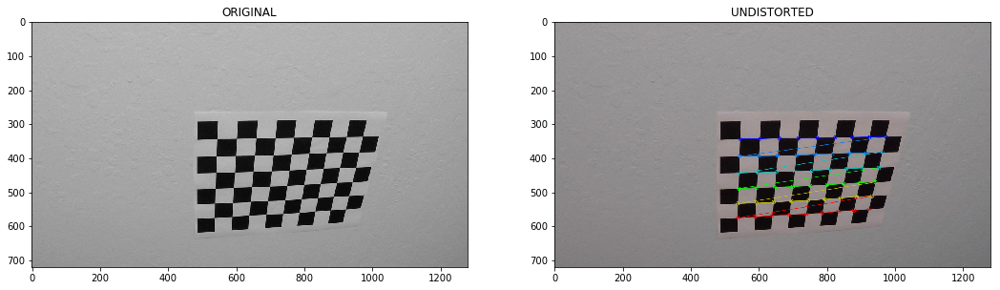

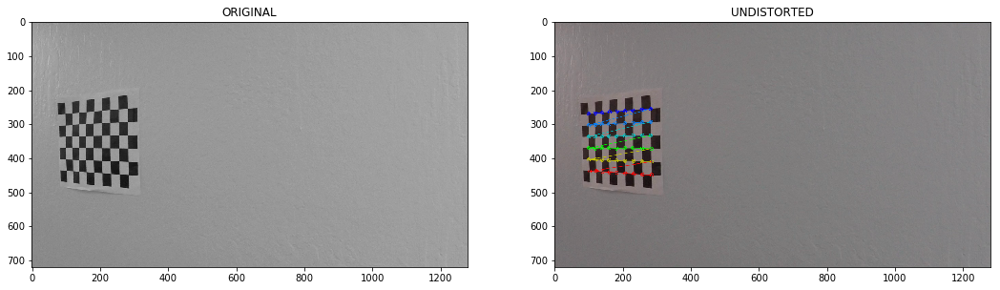

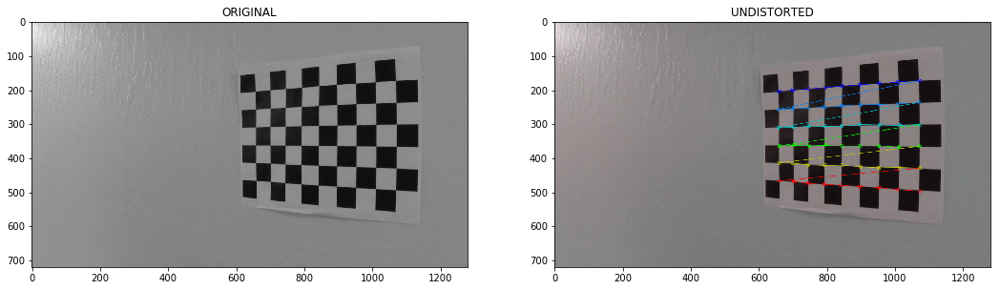

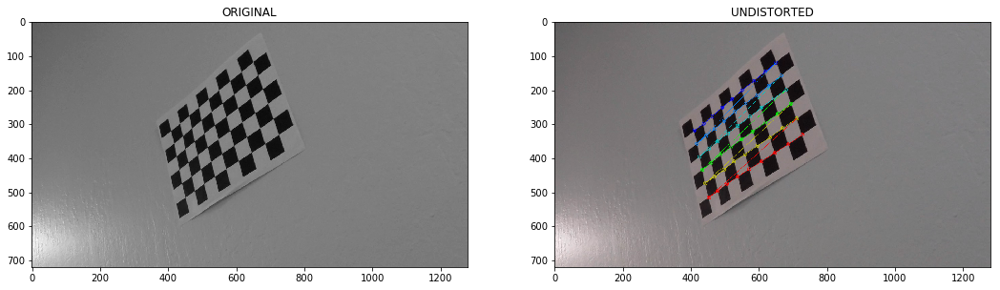

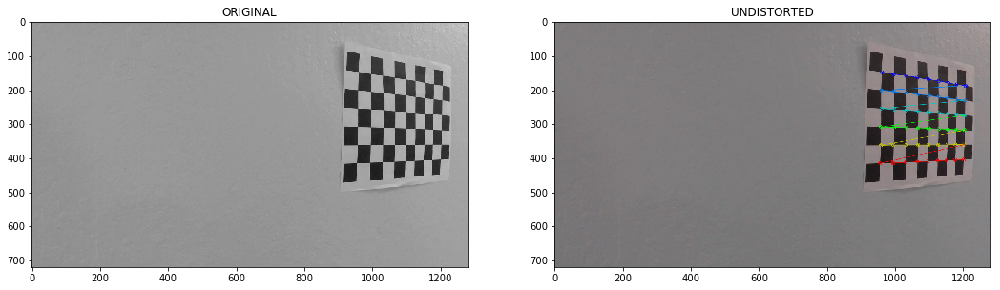

...

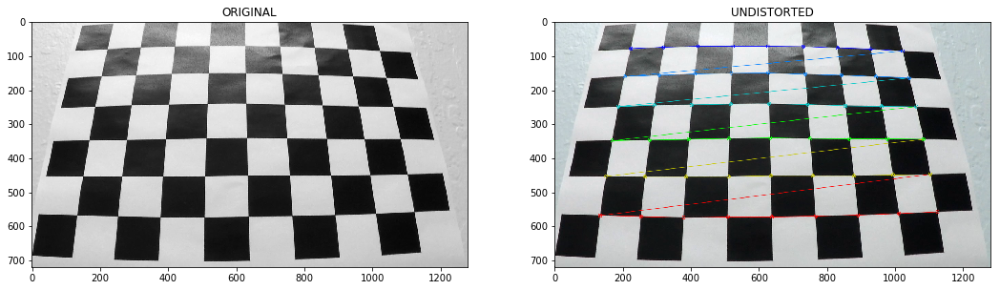

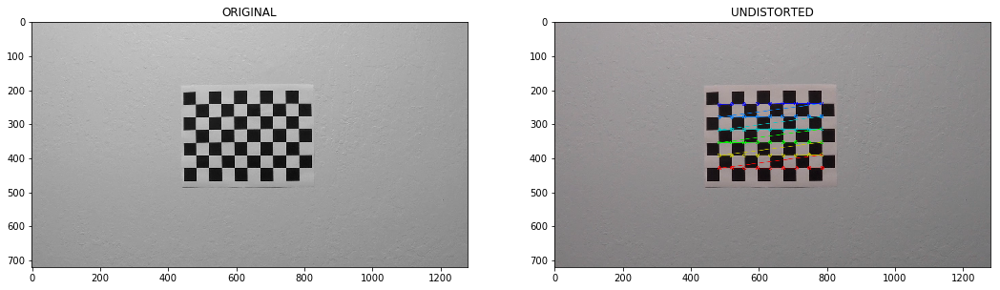

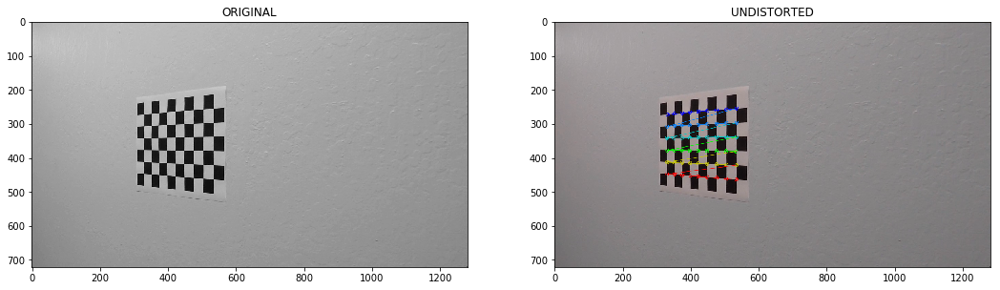

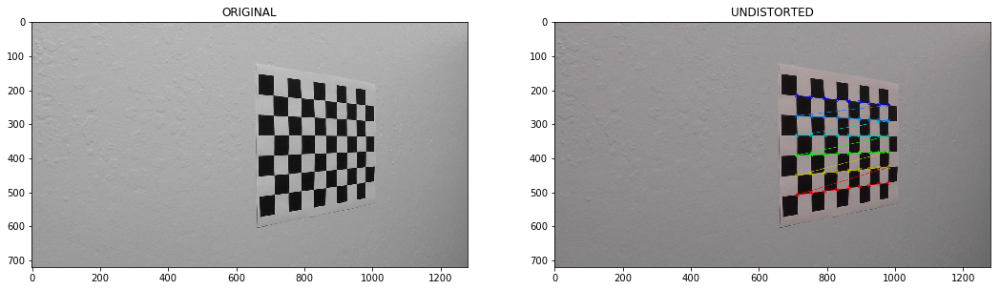

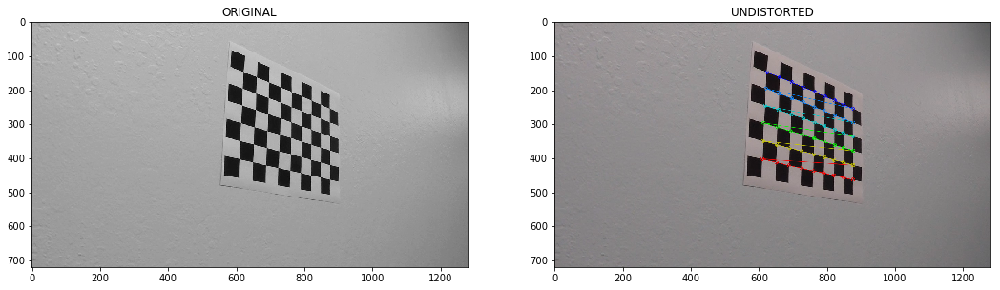

In [1]:
import numpy as np
import cv2
import glob
import helper
import matplotlib.pyplot as plt
%matplotlib inline

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        fig = plt.figure(figsize=(18,8))
        plt.subplot(121),plt.imshow(gray,'gray'),plt.title('ORIGINAL')
        plt.subplot(122),plt.imshow(img,'gray'),plt.title('UNDISTORTED')
        
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)

## 2. Use the camera calibration to correct chessboard distortion

(<matplotlib.axes._subplots.AxesSubplot at 0x1047ad128>,
 <matplotlib.text.Text at 0x11c5be6a0>)

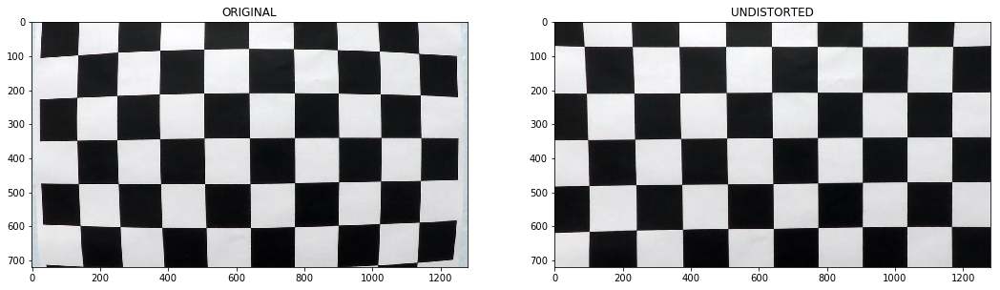

In [2]:
img = cv2.imread('camera_cal/calibration1.jpg')
dst = helper.undistort(img, mtx, dist)
fig = plt.figure(figsize=(18,8))
plt.subplot(121),plt.imshow(img,'gray'),plt.title('ORIGINAL')
plt.subplot(122),plt.imshow(dst,'gray'),plt.title('UNDISTORTED')

## 3. Show distortion-corrected test images

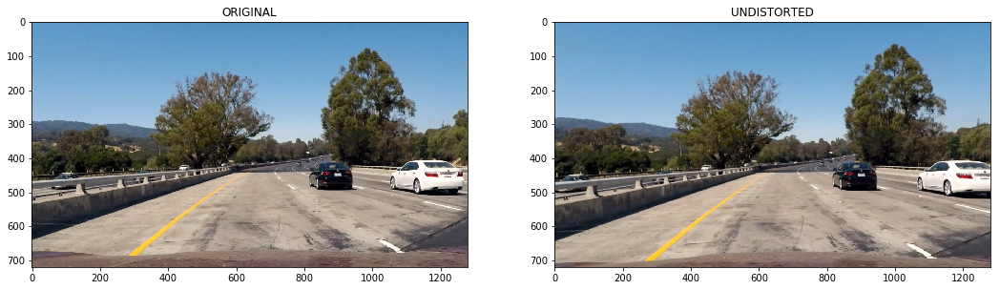

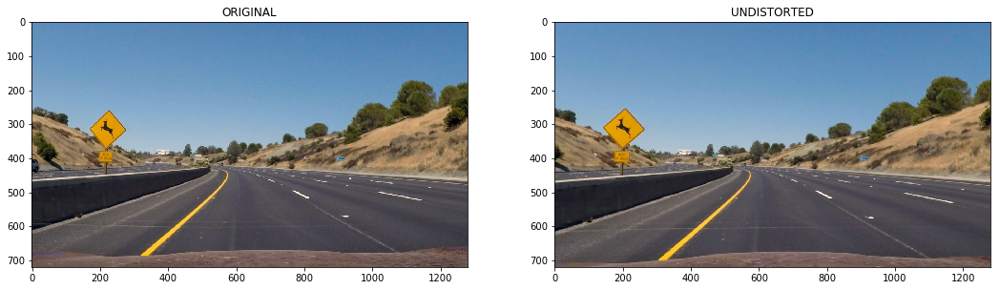

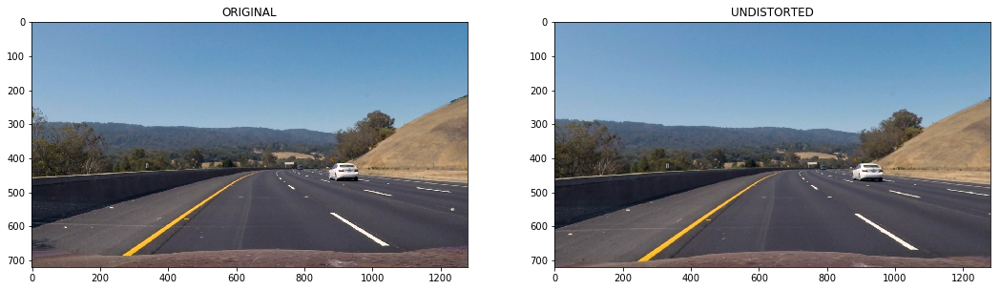

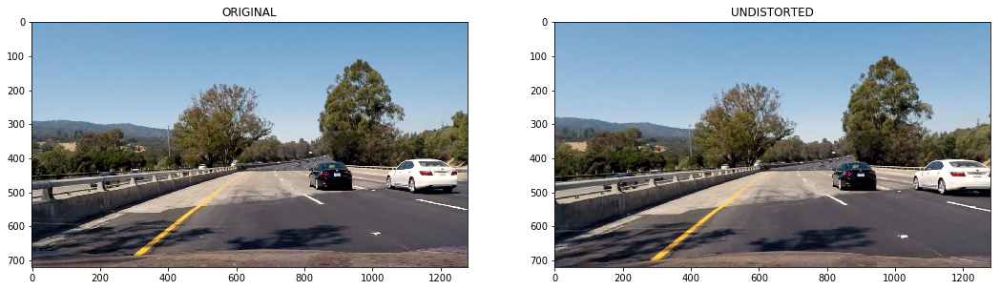

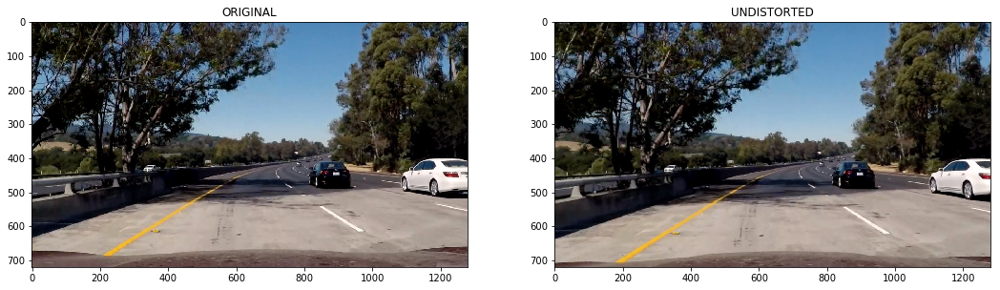

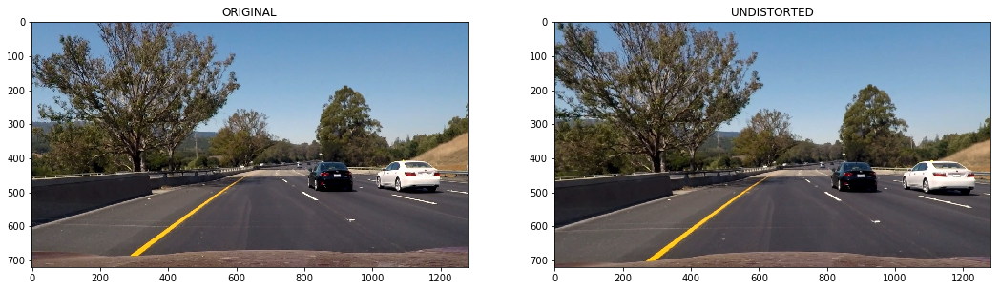

In [3]:
# Make a list of test images
images = glob.glob('test_images/test*.jpg')

for fname in images:
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    dst = helper.undistort(img, mtx, dist)
    fig = plt.figure(figsize=(18,8))
    plt.subplot(121),plt.imshow(img),plt.title('ORIGINAL')
    plt.subplot(122),plt.imshow(dst),plt.title('UNDISTORTED')

## Show distortion-corrected straight-lines images

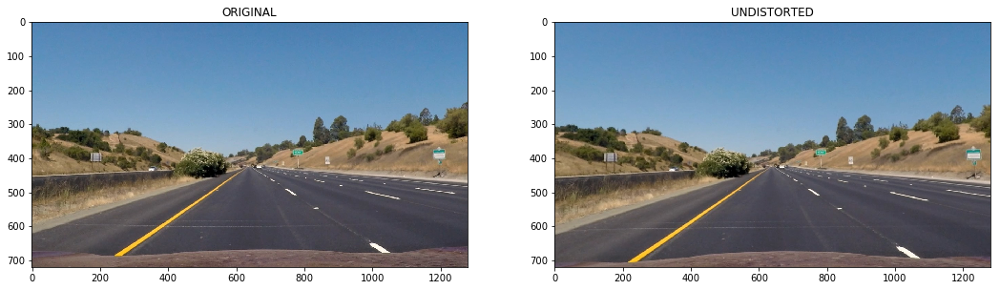

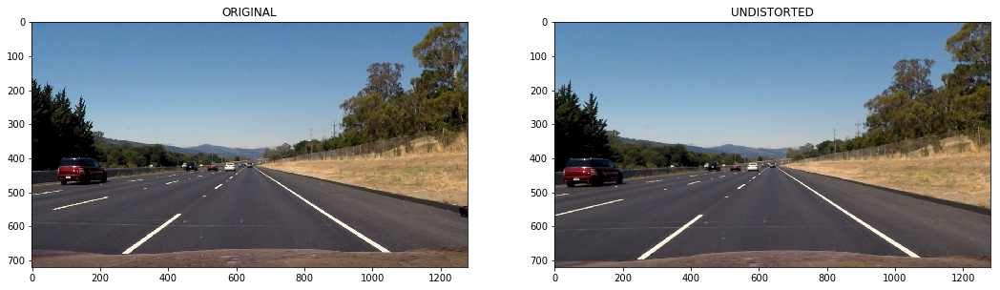

In [4]:
# Make a list of test images
images = glob.glob('test_images/straight_lines*.jpg')

for fname in images:
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    dst = helper.undistort(img, mtx, dist)
    fig = plt.figure(figsize=(18,8))
    plt.subplot(121),plt.imshow(img),plt.title('ORIGINAL')
    plt.subplot(122),plt.imshow(dst),plt.title('UNDISTORTED')

## 5. Warp straight-lines images

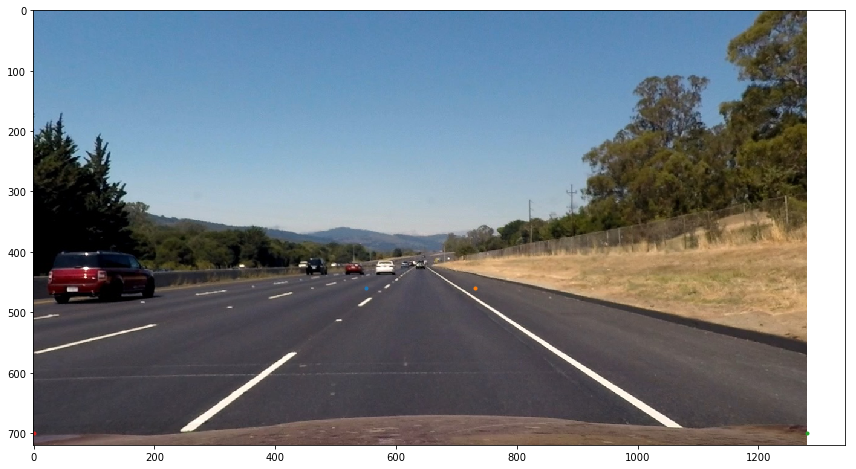

In [5]:
fig = plt.figure(figsize=(18,8))
plt.imshow(dst)
plt.plot(550, 460, '.')
plt.plot(730, 460, '.')
plt.plot(1280, 700, '.')
plt.plot(0, 700, '.')

## Show perspective-transformed straight-lines images

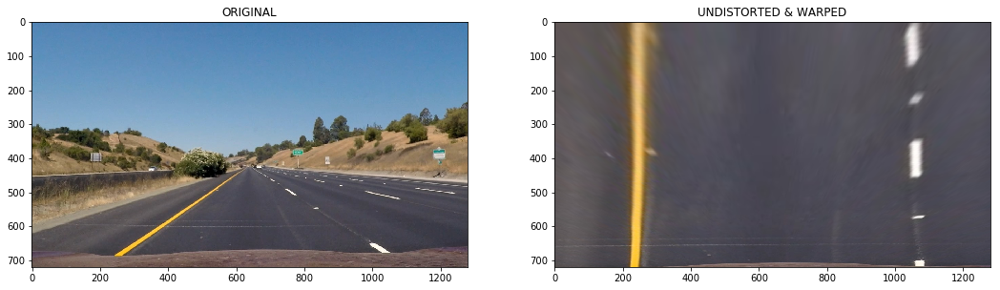

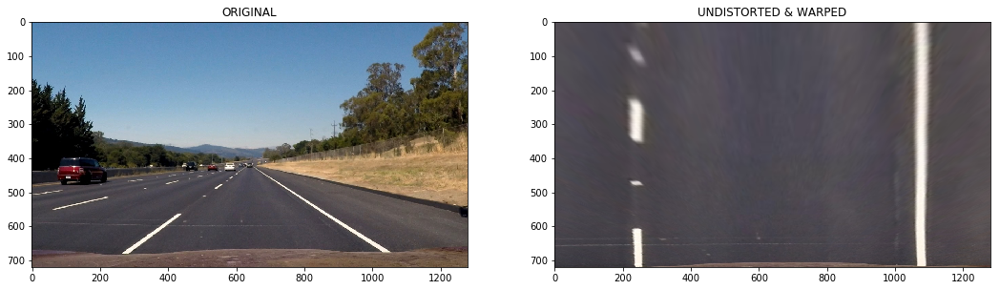

In [6]:
images = glob.glob('test_images/straight_lines*.jpg')
for fname in images:
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    dst = helper.undistort(img, mtx, dist)
    dst,_ = helper.warp(dst)
    fig = plt.figure(figsize=(18,8))
    plt.subplot(121),plt.imshow(img),plt.title('ORIGINAL')
    plt.subplot(122),plt.imshow(dst),plt.title('UNDISTORTED & WARPED')

## Show perspective-transformed test images

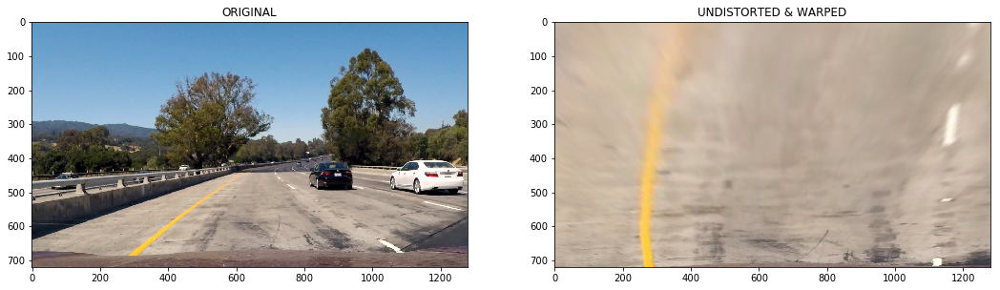

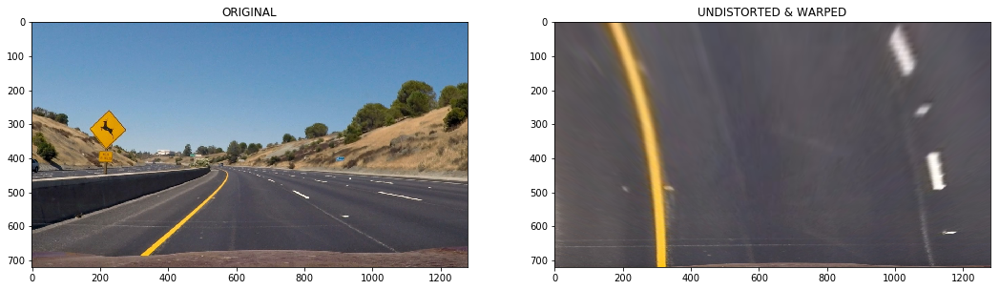

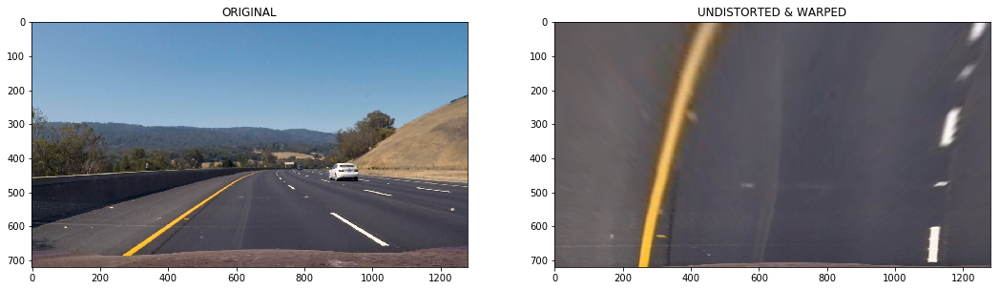

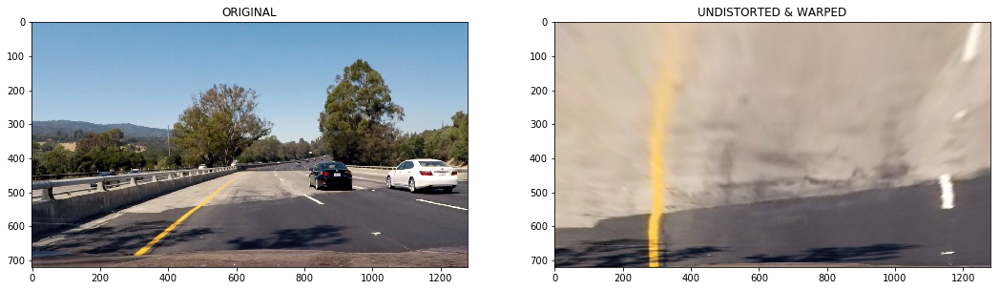

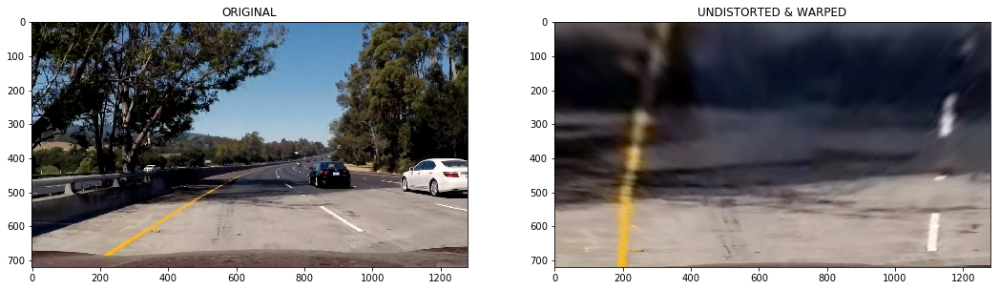

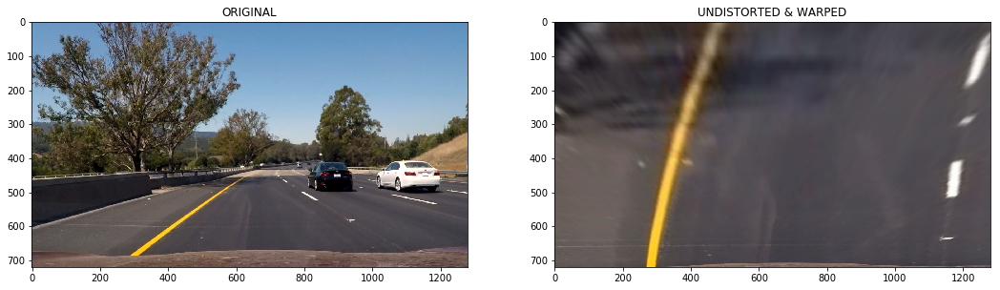

In [7]:
# Make a list of test images
images = glob.glob('test_images/test*.jpg')
for fname in images:
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    dst = helper.undistort(img, mtx, dist)
    dst,_ = helper.warp(dst)
    fig = plt.figure(figsize=(18,8))
    plt.subplot(121),plt.imshow(img),plt.title('ORIGINAL')
    plt.subplot(122),plt.imshow(dst),plt.title('UNDISTORTED & WARPED')

## 6. Create thresholded binary images: based on colorspace channels

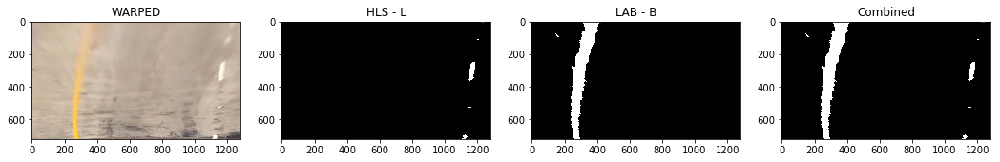

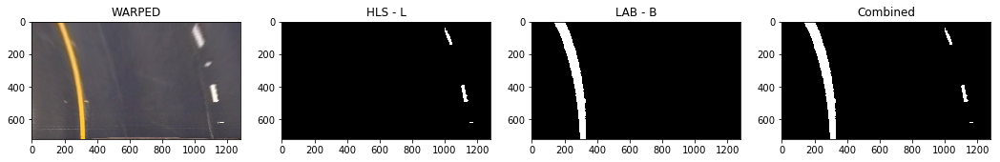

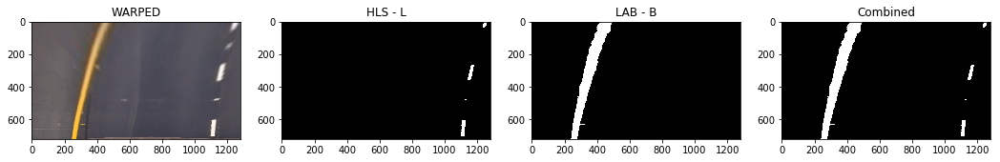

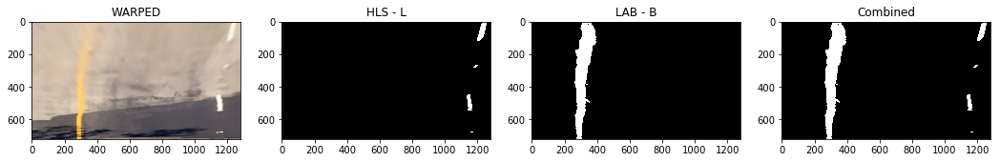

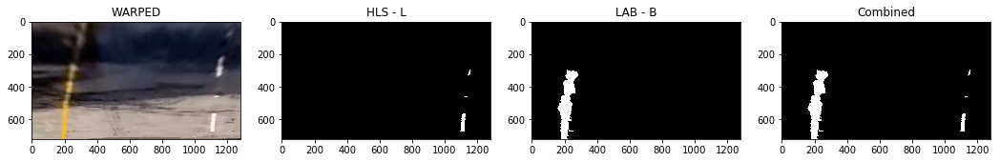

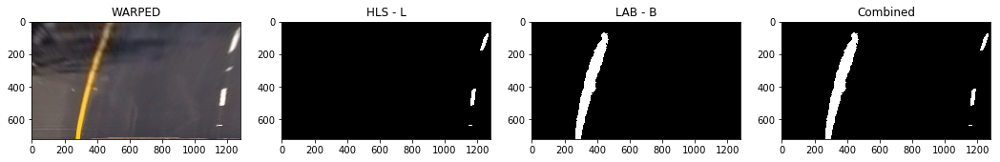

In [8]:
images = glob.glob('test_images/test*.jpg')
for fname in images:
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = helper.undistort(img, mtx, dist)
    img,_ = helper.warp(img)
    dst1,dst2,dst3 = helper.color_thred(img)
    fig = plt.figure(figsize=(18,8))
    plt.subplot(141),plt.imshow(img),plt.title('WARPED')
    plt.subplot(142),plt.imshow(dst1,'gray'),plt.title('HLS - L')
    plt.subplot(143),plt.imshow(dst2,'gray'),plt.title('LAB - B')
    plt.subplot(144),plt.imshow(dst3,'gray'),plt.title('Combined')

## Create thresholded binary images: based on Sobel gradients

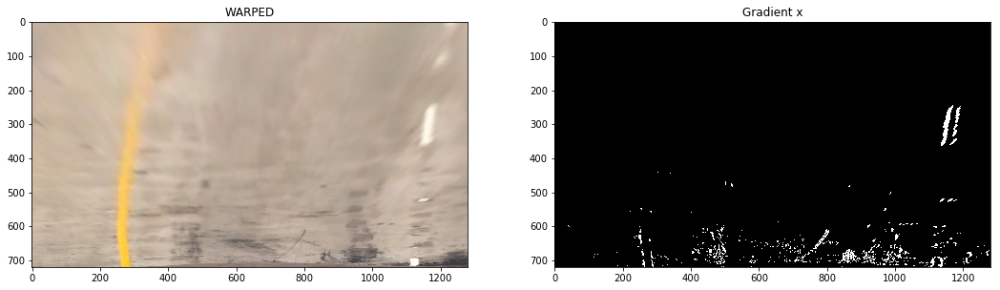

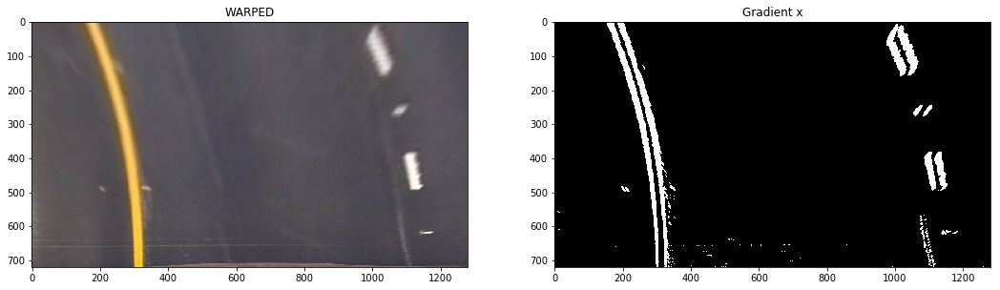

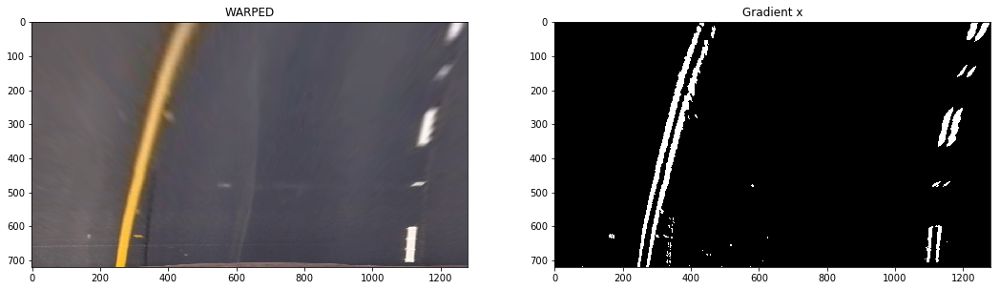

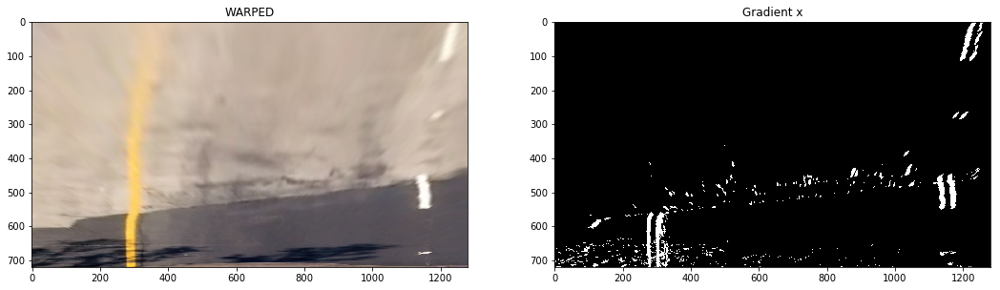

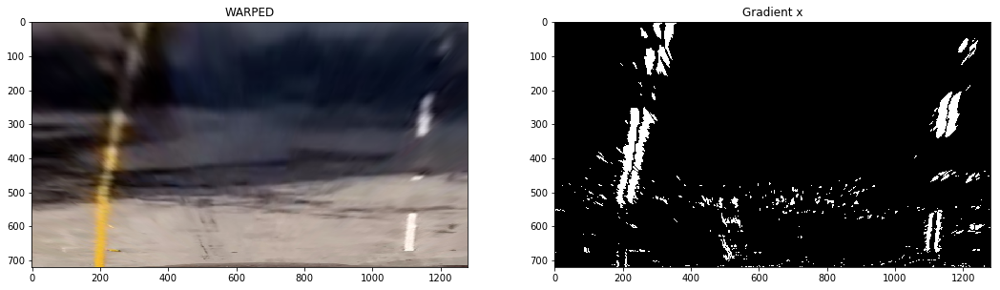

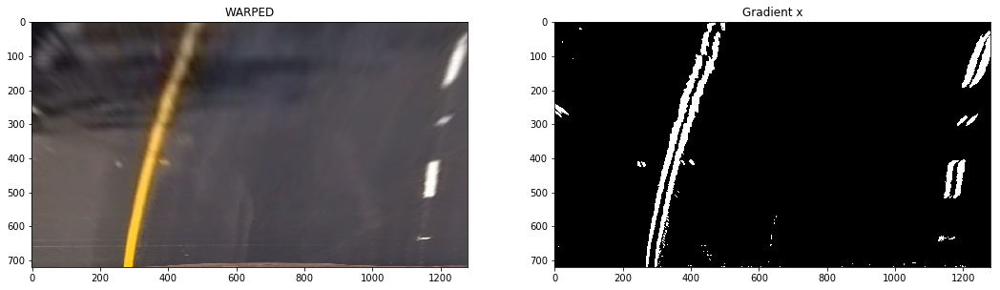

In [9]:
images = glob.glob('test_images/test*.jpg')
for fname in images:
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = helper.undistort(img, mtx, dist)
    img,_ = helper.warp(img)
    dst = helper.grad_thred(img)
    fig = plt.figure(figsize=(18,8))
    plt.subplot(121),plt.imshow(img),plt.title('WARPED')
    plt.subplot(122),plt.imshow(dst,'gray'),plt.title('Gradient x')

## Combine thresholded binary images based on colorspaces and gradients

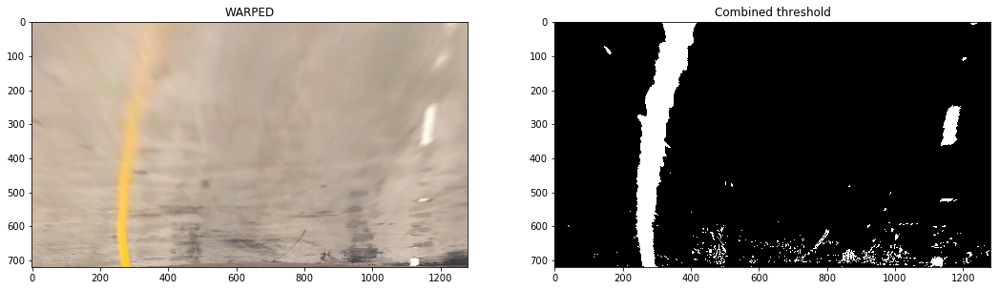

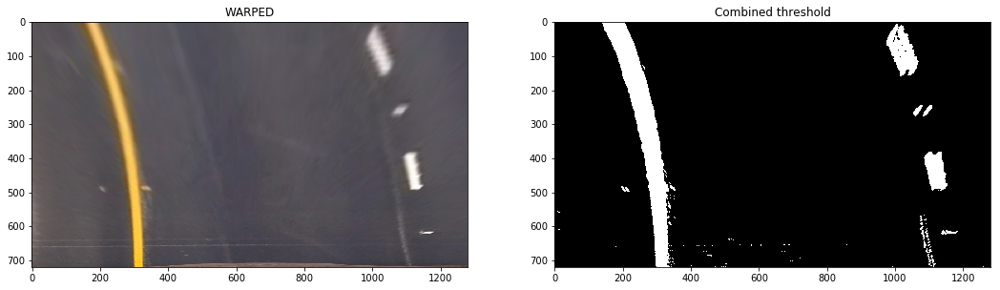

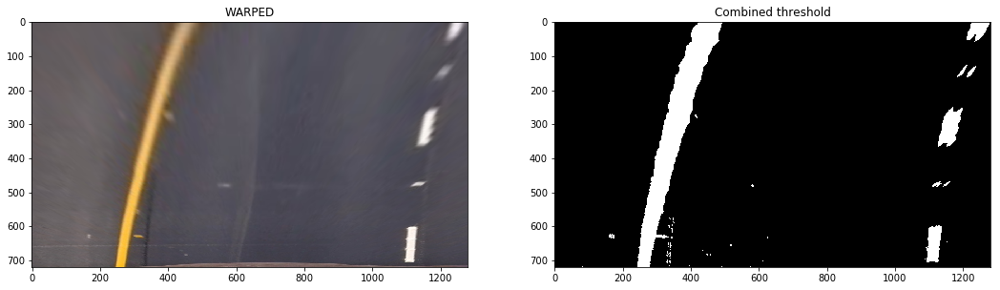

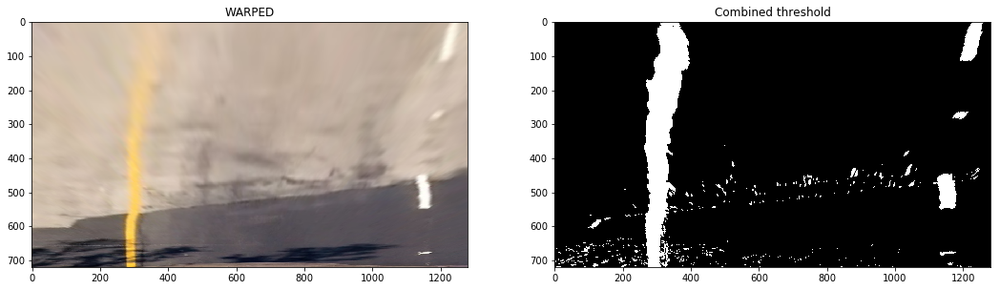

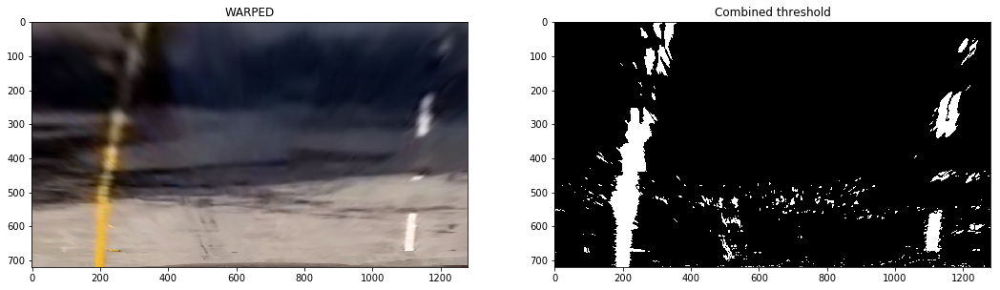

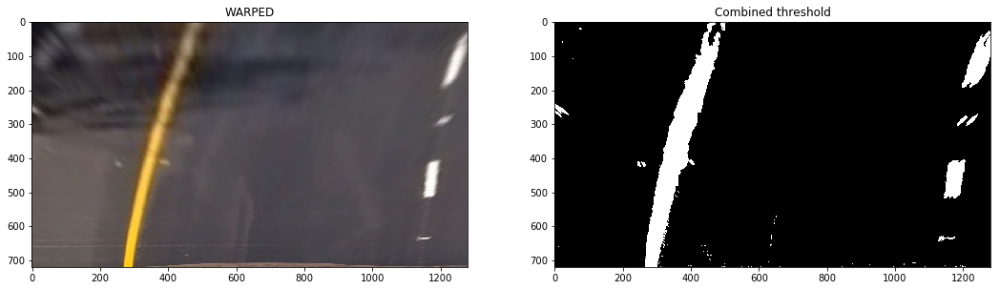

In [10]:
images = glob.glob('test_images/test*.jpg')
for fname in images:
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = helper.undistort(img, mtx, dist)
    img,_ = helper.warp(img)
    dst = helper.combine_threds(img)
    fig = plt.figure(figsize=(18,8))
    plt.subplot(121),plt.imshow(img),plt.title('WARPED')
    plt.subplot(122),plt.imshow(dst,'gray'),plt.title('Combined threshold')

## 7. Find lane lines, and fit polynomials of lines

/Users/HangYao/Documents/Python/CarND_workspace/CarND-Advanced-Lane-Lines/helper.py:120: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)


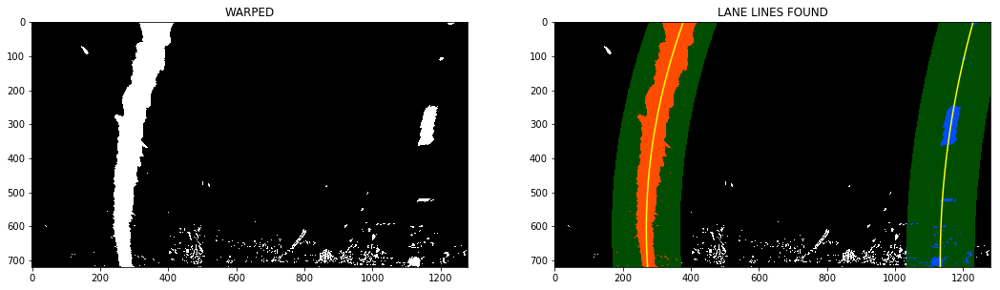

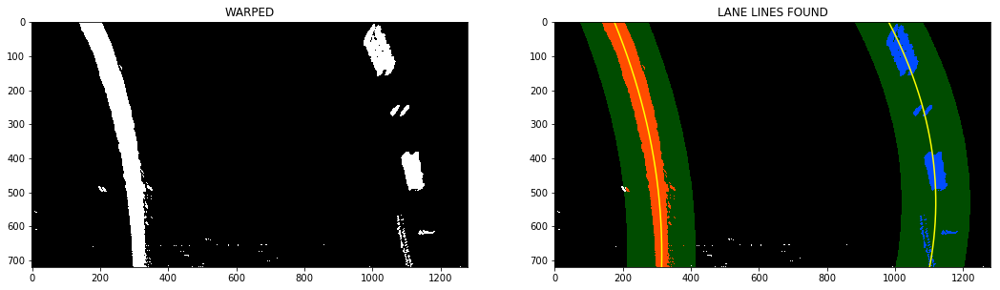

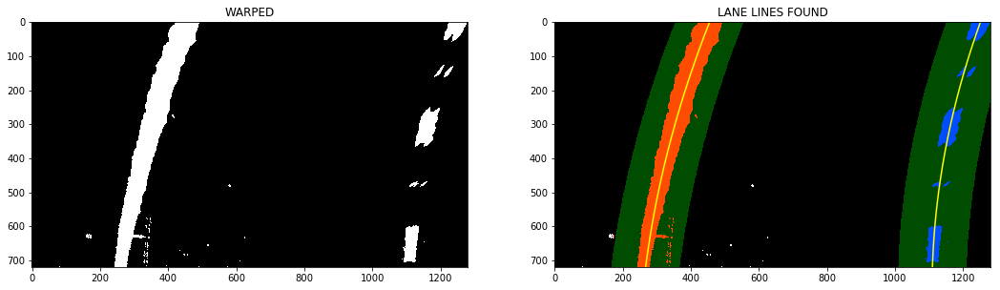

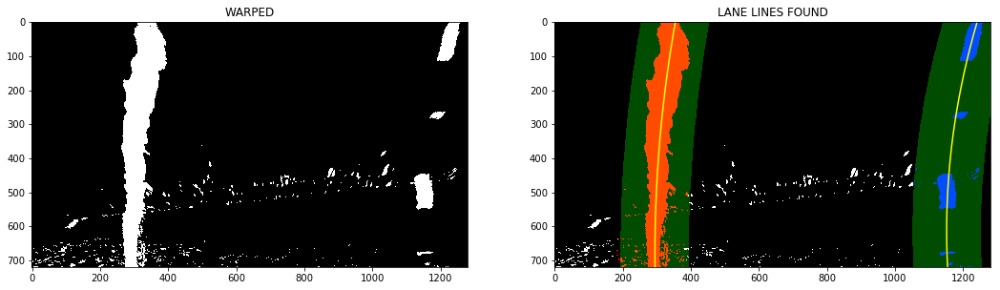

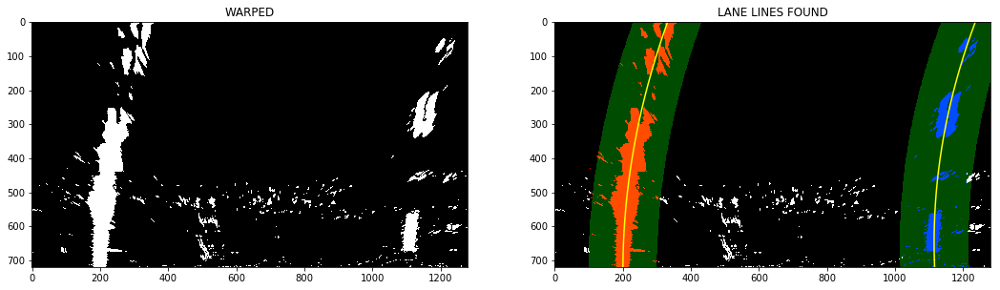

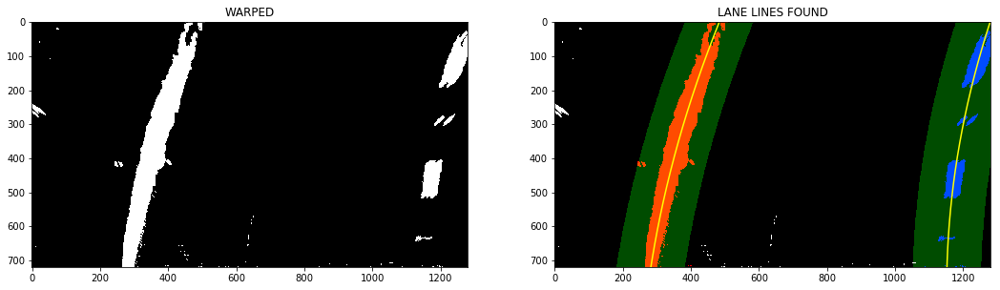

In [11]:
images = glob.glob('test_images/test*.jpg')
for fname in images:
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = helper.undistort(img, mtx, dist)
    img,_ = helper.warp(img)
    img = helper.combine_threds(img)
    leftx, lefty, rightx, righty = helper.locate_lanes(img)
    left_fit, right_fit = helper.fit_poly(leftx, lefty, rightx, righty)
    result, ploty, left_fitx, right_fitx = helper.fit_poly_plot(
        img, left_fit, right_fit, leftx, lefty, rightx, righty)
    fig = plt.figure(figsize=(18,8))
    plt.subplot(121),plt.imshow(img,'gray'),plt.title('WARPED')
    plt.subplot(122),plt.imshow(result),plt.title('LANE LINES FOUND')
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

## 8. Project fitted lines to orginal images

/Users/HangYao/Documents/Python/CarND_workspace/CarND-Advanced-Lane-Lines/helper.py:120: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)


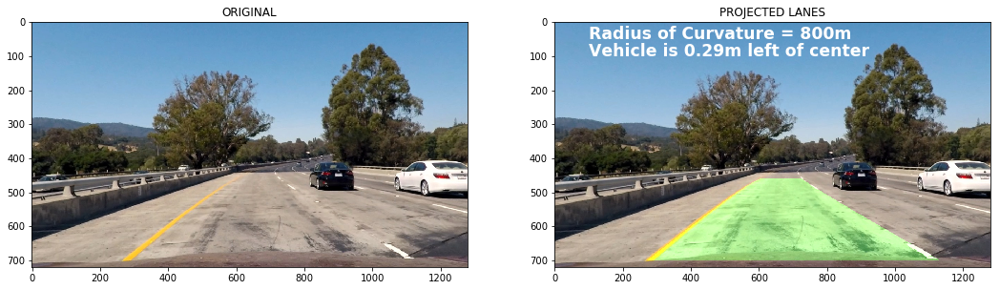

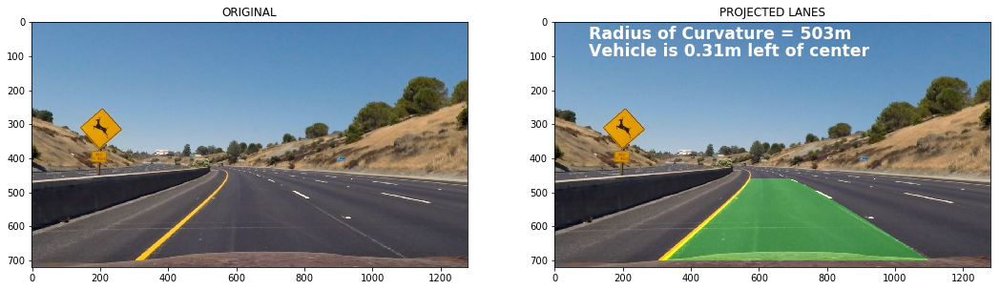

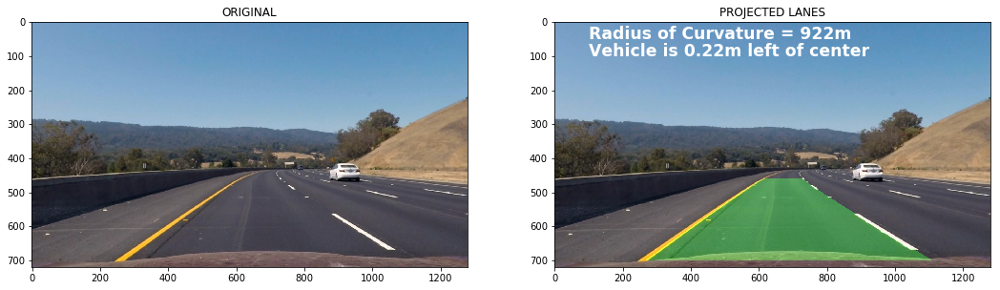

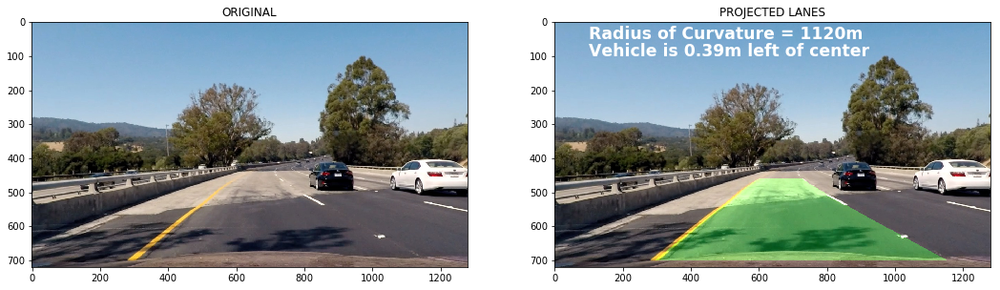

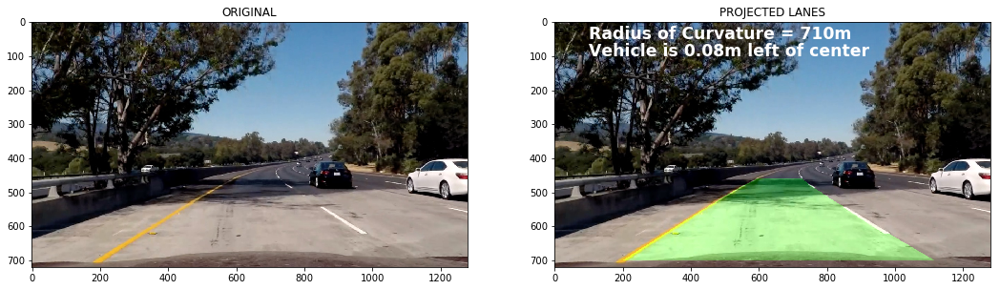

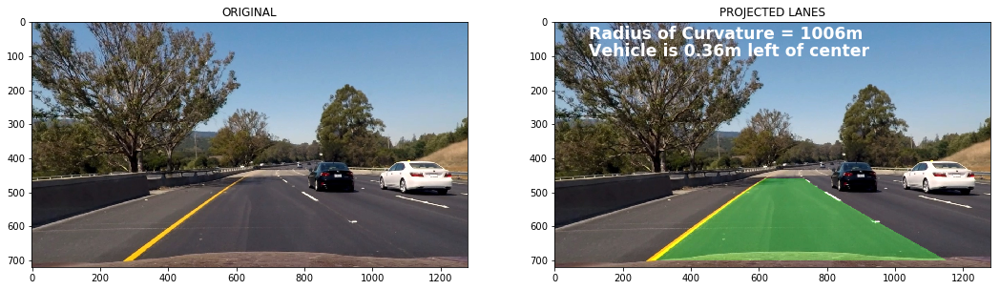

In [12]:
images = glob.glob('test_images/test*.jpg')
for fname in images:
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img0 = helper.undistort(img, mtx, dist)
    img, Minv = helper.warp(img0)
    img = helper.combine_threds(img)
    leftx, lefty, rightx, righty = helper.locate_lanes(img)
    left_fit, right_fit = helper.fit_poly(leftx, lefty, rightx, righty)
    left_fit_m, right_fit_m = helper.fit_poly_m(leftx, lefty, rightx, righty)
    _, ploty, left_fitx, right_fitx = helper.fit_poly_plot(img, left_fit, right_fit, leftx, lefty, rightx, righty)
    result = helper.project_lines(img0, img, Minv, ploty, left_fitx, right_fitx)
    left_curverad, right_curverad = helper.get_curv_m(img, left_fit_m, right_fit_m)
    curverad = (left_curverad + right_curverad) / 2
    left2c, right2c = helper.dist2center_m(img, left_fit, right_fit)
    if left2c < right2c: str_side = 'left'
    else: str_side = 'right'
    fig = plt.figure(figsize=(18,8))
    font = {'family': 'sans-serif',
            'color':  'white',
            'weight': 'bold',
            'size': 'xx-large',
           }
    plt.subplot(121),plt.imshow(img0),plt.title('ORIGINAL')
    plt.subplot(122),plt.imshow(result),plt.title('PROJECTED LANES')
    plt.text(100, 50, 'Radius of Curvature = {:.0f}m'.format(curverad), fontdict=font)
    plt.text(100, 100, 'Vehicle is {:.2f}m {:s} of center'.
             format(np.absolute((right2c-left2c)/2.), str_side), fontdict=font)

## 9. Process videos

In [3]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import line

def process_image(img):
    return helper.process_image(img, mtx, dist, left, right)

In [ ]:
left = line.Line()
right = line.Line()
video_output = 'test.mp4'
clip1 = VideoFileClip("project_video.mp4")
video_clip = clip1.fl_image(process_image)
%time video_clip.write_videofile(video_output, audio=False)

In [12]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))

## Challenge video

In [32]:
left = line.Line()
right = line.Line()
video_output = 'test_challenge.mp4'
clip1 = VideoFileClip("challenge_video.mp4")
video_clip = clip1.fl_image(process_image)
%time video_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video test_challenge.mp4
[MoviePy] Writing video test_challenge.mp4


100%|██████████| 485/485 [01:23<00:00,  5.04it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_challenge.mp4 

CPU times: user 2min 23s, sys: 16.4 s, total: 2min 39s
Wall time: 1min 25s


In [33]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))

## Harder challenge video

In [4]:
left = line.Line()
right = line.Line()
video_output = 'test_harder.mp4'
clip1 = VideoFileClip("harder_challenge_video.mp4")
video_clip = clip1.fl_image(process_image)
%time video_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video test_harder.mp4
[MoviePy] Writing video test_harder.mp4


100%|█████████▉| 1199/1200 [04:45<00:00,  4.77it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_harder.mp4 

CPU times: user 6min 53s, sys: 54.9 s, total: 7min 48s
Wall time: 4min 47s


In [5]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))